In [132]:
'''

Oversized Guassian (3x data) artificially 
centered; works best for collage smaples



'''

import os
import natsort
import numpy as np
from skimage import io
import matplotlib.pyplot as plt
import scipy.optimize as opt
from matplotlib import image
from matplotlib import pyplot as plt
data = plt.imread('/Users/brianmunson/Research/Focus_Pics/008/Image3_29.tif')


def find_center(arr):
    
    for x in range(len(arr)):
        for y in range(len(arr)):
            if arr[x,y] == arr.max():
                return x,y

x_0, y_0 = find_center(data)

def g_(x ,y,sig_x,sig_y, Amp = 1904,x_0 = len(data)/2,y_0=len(data)/2):

    return Amp*np.exp(-(((x-x_0)**2/(2*sig_x**2))+((y-y_0)**2/(2*sig_y**2))))

#Guassian to sutract
A = np.zeros(np.shape(data))
for x in np.arange(0,len(A)):
    for y in np.arange(0,len(A)):
        A[x][y] = g_(x,y,700,700)

#Axes to plot
np.random.seed(256)
npoints = len(data)**2
x_ = np.random.rand(npoints)
y_ = np.random.rand(npoints)
X,Y = np.meshgrid(np.linspace(x_.min(),x_.max(), len(data)),
                    np.linspace(y_.min(),y_.max(),len(data)))

#checking the fit
fig, axs = plt.subplots(2, 2, figsize = (10, 10))

ax = axs[0, 0]
art = ax.pcolor(X, Y, data, shading='auto')
plt.colorbar(art, ax=ax, label='z')
ax.set_title('Data')

ax = axs[0, 1]
art = ax.pcolor(X, Y, A, shading='auto')
plt.colorbar(art, ax=ax, label='z')
ax.set_title('Fit')

ax = axs[1, 0]
art = ax.pcolor(X, Y, data-A, shading='auto')
plt.colorbar(art, ax=ax, label='z')
ax.set_title('Data - Fit')

for ax in axs.ravel():
    ax.set_xlabel('x')
    ax.set_ylabel('y')
axs[1, 1].remove()
plt.savefig("ms_gaussFit_centered.pdf")
plt.show()


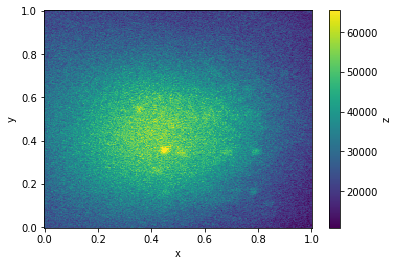

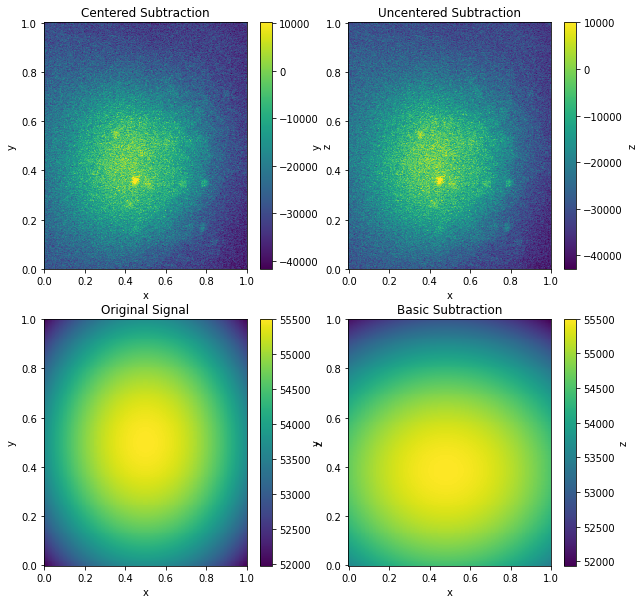

In [5]:
'''

This block experiments with gaussian centering
g is not normailzed to amplitude
^gaussian centered from arr.max() to 99th percentile
^Altered to plot centered and uncentered gaussians and baic subtraction

'''

from PIL import Image
import os
import natsort
import numpy as np
from skimage import io
import matplotlib.pyplot as plt
import scipy.optimize as opt
from matplotlib import image
from matplotlib import pyplot as plt
img = np.array(Image.open('/Users/brianmunson/Research/Focus_Pics/008/Image3_29.tif'))
data = img[128:384, 128:384]

def find_center(arr):
    
    for x in range(len(arr)):
        for y in range(len(arr)):
            if arr[x,y] == np.nanpercentile(arr,99):
                return x,y

u_x, u_y = find_center(data)

def g_(x ,y,sig_x,sig_y, Amp = np.nanpercentile(data, 99),x_0 = len(data)/2,y_0=len(data)/2):

    return Amp*np.exp(-(((x-x_0)**2/(2*sig_x**2))+((y-y_0)**2/(2*sig_y**2))))

def g(x ,y,sig_x,sig_y, Amp = np.nanpercentile(data, 99),x_0 = u_x, y_0 = u_y):

    return Amp*np.exp(-(((x-x_0)**2/(2*sig_x**2))+((y-y_0)**2/(2*sig_y**2))))


#Guassian to sutract

#conditionally centered
A = np.zeros(np.shape(data))
for x in np.arange(0,len(A)):
    for y in np.arange(0,len(A)):
        A[x][y] = g(x,y,500,700)

#artificially centered
A_ = np.zeros(np.shape(data))
for x in np.arange(0,len(A)):
    for y in np.arange(0,len(A)):
        A_[x][y] = g_(x,y,500,500)


#Axes to plot
np.random.seed(256)
npoints = len(data)**2
x_ = np.random.rand(npoints)
y_ = np.random.rand(npoints)
X,Y = np.meshgrid(np.linspace(x_.min(),x_.max(), 256),
                    np.linspace(y_.min(),y_.max(),256))

fig, ax = plt.subplots()
art = ax.pcolor(X , Y , data, shading = 'auto')
plt.colorbar(art,ax=ax,label='z')
ax.set_xlabel('x')
ax.set_ylabel('y')
#plt.savefig('ms_Lmfit_raw.pdf')
plt.show()

#checking the fit
fig, axs = plt.subplots(2, 2, figsize = (10, 10))

ax = axs[0, 0]
art = ax.pcolor(X, Y, data-A_, shading='auto')
plt.colorbar(art, ax=ax, label='z')
ax.set_title('Centered Subtraction')

ax = axs[0, 1]
art = ax.pcolor(X, Y, data-A, shading='auto')
plt.colorbar(art, ax=ax, label='z')
ax.set_title('Uncentered Subtraction')

ax = axs[1, 0]
art = ax.pcolor(X, Y, A_, shading='auto')
plt.colorbar(art, ax=ax, label='z')
ax.set_title('Original Signal')


ax = axs[1, 1]
art = ax.pcolor(X, Y, A, shading='auto')
plt.colorbar(art, ax=ax, label='z')
ax.set_title('Basic Subtraction')


for ax in axs.ravel():
    ax.set_xlabel('x')
    ax.set_ylabel('y')
plt.savefig("ms_gaussFit_uncentered_centered.pdf")
plt.show()


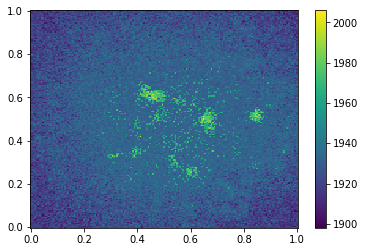

In [270]:
for x in range(len(data)):
    for y in range(len(data)):
        if 1940<data[x,y]<1960:
            data[x,y] = np.mean(data)

fig, ax = plt.subplots()
art = ax.pcolor(X,Y,data)
plt.colorbar(art,ax=ax)
plt.savefig("ms_img_basic_subtraction")


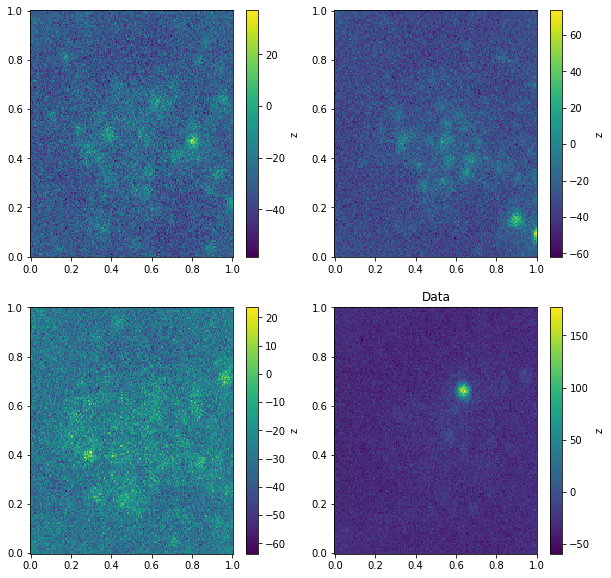

In [1]:
'''

Processing of all images into
concat dir


'''

import numpy as np
from PIL import Image
from matplotlib import pyplot as plt
import os
data = np.loadtxt('/Users/brianmunson/Research/vscode/singleImagesForConcatination10x10/img-3.65-3.5100000000000016.txt')


def find_center(arr):
    
    for x in range(len(arr)):
        for y in range(len(arr)):
            if arr[x,y] == arr.max():
                return x,y

x_0, y_0 = find_center(data)

def g_(x ,y,sig_x,sig_y, Amp = np.nanpercentile(data, 99),x_0 = len(data)/2,y_0=len(data)/2):

    return Amp*np.exp(-(((x-x_0)**2/(2*sig_x**2))+((y-y_0)**2/(2*sig_y**2))))


##Axes to plot
#np.random.seed(256)
#npoints = len(data)**2
#x_ = np.random.rand(npoints)
#y_ = np.random.rand(npoints)
#X,Y = np.meshgrid(np.linspace(x_.min(),x_.max(), len(data)),
#                    np.linspace(y_.min(),y_.max(),len(data)))
#
##checking the fit
#fig, axs = plt.subplots(2, 2, figsize = (10, 10))
#
#ax = axs[0, 0]
#art = ax.pcolor(X, Y, data, shading='auto')
#plt.colorbar(art, ax=ax, label='z')
#ax.set_title('Data')
#
#ax = axs[0, 1]
#art = ax.pcolor(X, Y, A, shading='auto')
#plt.colorbar(art, ax=ax, label='z')
#ax.set_title('Fit')
#
#ax = axs[1, 0]
#art = ax.pcolor(X, Y, data-A, shading='auto')
#plt.colorbar(art, ax=ax, label='z')
#ax.set_title('Data - Fit')
#
#for ax in axs.ravel():
#    ax.set_xlabel('x')
#    ax.set_ylabel('y')
#axs[1, 1].remove()
#plt.savefig("ms_Lmfit_sub.pdf")
#plt.show()

arr_lst = []
for path, directories, files in os.walk('/Users/brianmunson/Research/vscode/singleImagesForConcatination10x10'):
    for image in files:
        data = np.loadtxt(path+'/'+image)
        #Guassian to sutract
        A = np.zeros(np.shape(data))
        for x in np.arange(0,len(A)):
            for y in np.arange(0,len(A)):
                A[x][y] = g_(x,y,700,700)
        arr_lst.append(data-A)

#Axes to plot
np.random.seed(256)
npoints = len(data)**2
x_ = np.random.rand(npoints)
y_ = np.random.rand(npoints)
X,Y = np.meshgrid(np.linspace(x_.min(),x_.max(), len(data)),
                    np.linspace(y_.min(),y_.max(),len(data)))

fig, axs = plt.subplots(2, 2, figsize = (10, 10))
ax = axs[0, 0]
art = ax.pcolor(X, Y, arr_lst[6], shading='auto')
plt.colorbar(art, ax=ax, label='z')
ax = axs[1, 0]
art = ax.pcolor(X, Y, arr_lst[5], shading='auto')
plt.colorbar(art, ax=ax, label='z')
ax = axs[0, 1]
art = ax.pcolor(X, Y, arr_lst[4], shading='auto')
plt.colorbar(art, ax=ax, label='z')
ax = axs[1, 1]
art = ax.pcolor(X, Y, arr_lst[3], shading='auto')
plt.colorbar(art, ax=ax, label='z')
ax.set_title('Data')

plt.savefig("ms_guassFit_subracted_img.pdf")
plt.show()

In [1]:
'''

Attempt to fit guassian parameters
^fit amplitude
^for loops to creat arrays which would then be fit takes too long - need algabraic method
^Considered finding center outside of fitting loops


'''


import numpy as np
from PIL import Image
from matplotlib import pyplot as plt
data = np.loadtxt('/Users/brianmunson/Research/vscode/singleImagesForConcatination10x10/img-3.65-3.5100000000000016.txt')

def find_center(arr):
    
    for x in range(len(arr)):
        for y in range(len(arr)):
            if arr[x,y] == np.nanpercentile(arr, 99):
                return x,y
x_0,y_0 = find_center(data)

def min_cost(arr_cost):
    for i in range(len(arr_cost)):
        if arr_cost[i] == min(arr_cost):
            return i

def g(vals,x_0,y_0,sig, amp):
    x,y = vals
    #x_0,y_0 = center
    sig_x,sig_y = sig

    return amp*np.exp(-(((x-x_0)**2/(2*sig_x**2))+((y-y_0)**2/(2*sig_y**2))))

x_0, y_0 = find_center(data)

xy_lst = list()
amp_lst = list()
sig_lst = list()
to_fit = list()
fit_lst = list()
for x in range(len(data)):
    for y in range(len(data)):
        xy_lst.append((x,y))

for sig_x in range(1,len(data)):
    for sig_y in range(1,len(data)):
        sig_lst.append((sig_x,sig_y))

for amp in np.arange(data.min(),data.max()):
            amp_lst.append(amp)

for val in xy_lst:
    for sig in sig_lst:
        A = g(val,x_0,y_0,sig,np.nanpercentile(data, 99))

#fig, axs = plt.subplots(2, 2, figsize = (10, 10))
#ax = axs[0, 0]
#art = ax.pcolor(X, Y, arr_lst[6], shading='auto')
#plt.colorbar(art, ax=ax, label='z')
#ax = axs[1, 0]
#art = ax.pcolor(X, Y, arr_lst[5], shading='auto')
#plt.colorbar(art, ax=ax, label='z')
#ax = axs[0, 1]
#art = ax.pcolor(X, Y, arr_lst[4], shading='auto')
#plt.colorbar(art, ax=ax, label='z')
#ax = axs[1, 1]
#art = ax.pcolor(X, Y, arr_lst[3], shading='auto')
#plt.colorbar(art, ax=ax, label='z')
#ax.set_title('Data')
#
#plt.savefig("ms_guassFit_subracted_img.pdf")
#plt.show()


KeyboardInterrupt: 

In [6]:
'''

Attempt to fit guassian parameters
^fit amplitude
^Amplitude fitted


'''

import numpy as np
from PIL import Image
from matplotlib import pyplot as plt


def min_cost(arr_cost):
    for i in range(len(arr_cost)):
        if arr_cost[i] == min(arr_cost):
            return i


def g_(x ,y,sig_x,sig_y,Amp,x_0 = len(data)/2,y_0=len(data)/2):

    return Amp*np.exp(-(((x-x_0)**2/(2*sig_x**2))+((y-y_0)**2/(2*sig_y**2))))


            

A = np.zeros(np.shape(data))
for path, directories, files in os.walk('/Users/brianmunson/Research/vscode/singleImagesForConcatination10x10'):
    for image in files:
        data = np.loadtxt(path+'/'+image)
        arr_lst = list()
        sub_lst = list()
        arr_cost = list()
        amp_lst = list()

        for val in np.arange(data.min(),data.max()):
            amp_lst.append(val)

        for amp in amp_lst:
            for x in np.arange(0,len(A)):
                for y in np.arange(0,len(A)):
                    A[x][y] = g_(x,y,700,700,amp)
            arr_lst.append(A.flatten())
        
        for arr in arr_lst:
            arr_cost.append(sum(abs(data.flatten()**2-val**2)))
        print(amp_lst[min_cost(arr_cost)])

        A_fit = np.zeros(np.shape(data))
        for x in range(len(data)):
            for y in range(len(data)):
                A_fit[x][y] = g_(x,y,700,700,amp_lst[min_cost(arr_cost)])
        sub_lst.append(A_fit)



1908.0
1903.0
1905.0
1894.0
1893.0
1893.0
1894.0
1895.0
1902.0
1900.0
1900.0
1905.0
1896.0
1899.0
1904.0
1906.0
1894.0
1896.0
1897.0
1898.0
1896.0
1896.0
1898.0
1893.0
1905.0
1900.0
1905.0
1901.0
1911.0
1905.0
1905.0
1909.0
1909.0
1904.0
1895.0
1893.0
1900.0
1893.0
1901.0
1896.0
1896.0
1891.0
1908.0
1900.0
1898.0
1904.0
1897.0
1898.0
1894.0
1892.0
1896.0
1898.0
1899.0
1900.0
1905.0
1905.0
1903.0
1900.0
1897.0
1906.0
1902.0
1896.0
1894.0
1903.0
1904.0
1900.0
1904.0
1904.0
1904.0
1901.0
1898.0
1900.0
1894.0
1906.0
1897.0
1898.0
1895.0
1901.0
1898.0
1898.0
1896.0
1900.0
1909.0
1897.0
1900.0
1897.0
1892.0
1906.0
1902.0
1902.0
1905.0
1904.0
1900.0
1899.0
1906.0
1904.0
1910.0
1902.0
1902.0
1900.0


In [12]:
sub_fit_lst = []
for path, directories, files in os.walk('/Users/brianmunson/Research/vscode/singleImagesForConcatination10x10'):
    for image in files:
        data = np.loadtxt(path+'/'+image)
        #Guassian to sutract
        for fit in sub_lst:
            sub_fit_lst.append(data-fit)

In [13]:
with open("fitted_amp.txt", "w") as output:
    output.write(str(sub_fit_lst))

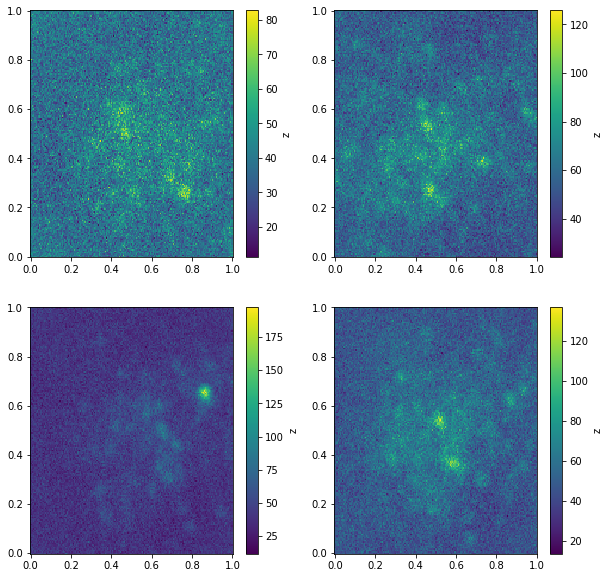

In [14]:
#Axes to plot
np.random.seed(256)
npoints = len(data)**2
x_ = np.random.rand(npoints)
y_ = np.random.rand(npoints)
X,Y = np.meshgrid(np.linspace(x_.min(),x_.max(), len(data)),
                    np.linspace(y_.min(),y_.max(),len(data)))

fig, axs = plt.subplots(2, 2, figsize = (10, 10))
ax = axs[0, 0]
art = ax.pcolor(X, Y, sub_fit_lst[50], shading='auto')
plt.colorbar(art, ax=ax, label='z')
ax = axs[1, 0]
art = ax.pcolor(X, Y, sub_fit_lst[40], shading='auto')
plt.colorbar(art, ax=ax, label='z')
ax = axs[0, 1]
art = ax.pcolor(X, Y, sub_fit_lst[30], shading='auto')
plt.colorbar(art, ax=ax, label='z')
ax = axs[1, 1]
art = ax.pcolor(X, Y, sub_fit_lst[99], shading='auto')
plt.colorbar(art, ax=ax, label='z')


plt.show()

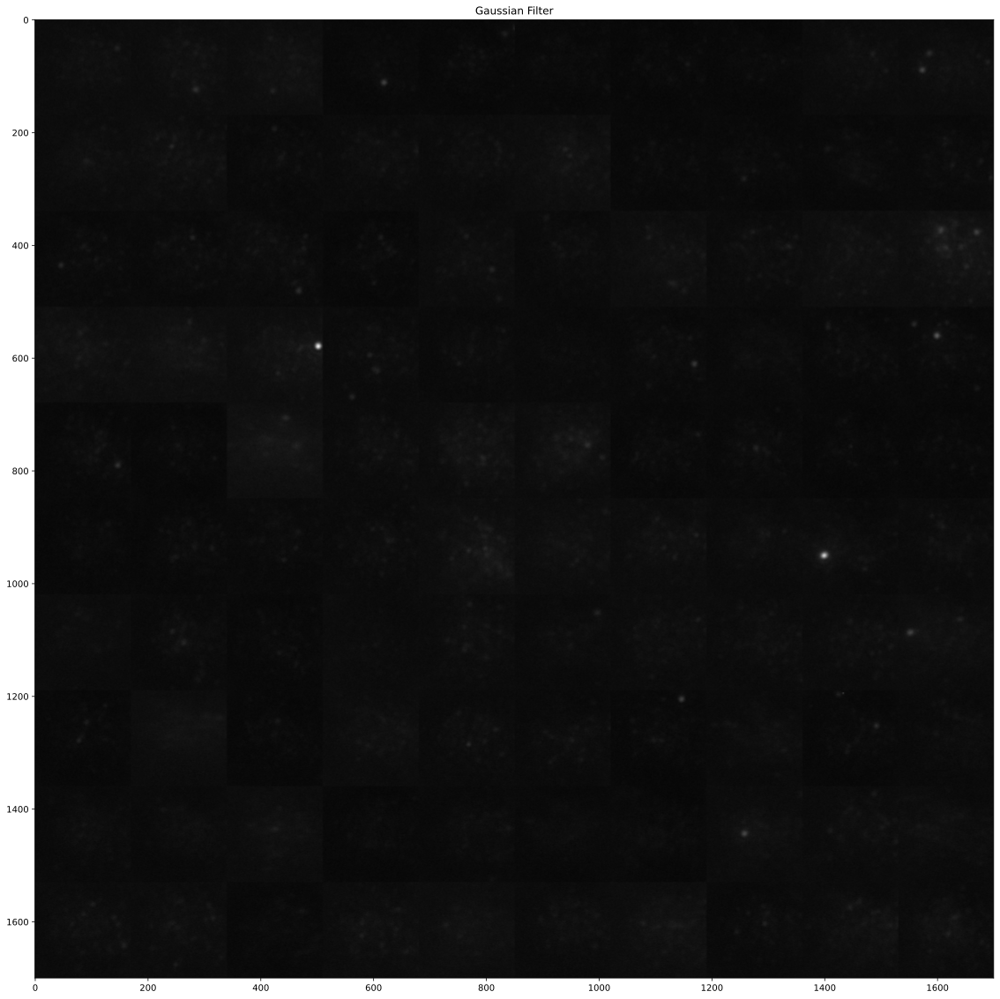

In [20]:

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from scipy import ndimage
import os
from skimage import filters
%config InlineBackend.figure_format = 'svg'


#here we apply a gaussian filter to each image individually, do we want to do them all w the same gaussian?
#the gaussian filter doesnt change that much iimage to image but even tiny changes might make enough of a case to try same one?
#or keep them as individual bc laser might change slightly?

def applyFilter(image):

   # the smaller Gaussian is just there to remove
   # noise so it can be just a few pixels
   small_gaussian = filters.gaussian(image, sigma = 0)

   # the larger Gaussian has to be bigger than our largest
   # object, which we can measure or make an educated guess
   large_gaussian = filters.gaussian(image, sigma = 7)

   # now we subtract the large gaussian from the small one
   endimage = small_gaussian - large_gaussian
   '''
   # visualising the results
   fig, (ax1,ax12, ax2, ax3) = plt.subplots(1, 4, figsize =(20,20))
   ax1.imshow(image, cmap = 'gray')
   ax1.set_title('Original')
   ax12.imshow(small_gaussian, cmap = 'gray')
   ax12.set_title('smallgaussian')
   ax2.imshow(large_gaussian, cmap = 'gray')
   ax2.set_title('Large Gaussian')
   ax3.imshow(endgaussuan, cmap = 'gray')
   ax3.set_title('Subtractlarge from small gaussian Image')
   plt.show()
   '''
   return endimage
   

#def find_center(arr):
#    
#    for x in range(len(arr)):
#        for y in range(len(arr)):
#            if arr[x,y] == arr.max():
#                return x,y
#
#def g_(x ,y,sig_x,sig_y,Amp = np.nanpercentile(data, 99), x_0 = len(data)/2, y_0 = len(data)/2, ):
#   
#   return Amp*np.exp(-(((x-x_0)**2/(2*sig_x**2))+((y-y_0)**2/(2*sig_y**2))))
#
#arr_lst = []
#for path, directories, files in os.walk('/Users/brianmunson/Research/vscode/singleImagesForConcatination10x10'):
#    for image in files:
#        data = np.loadtxt(path+'/'+image)
#        #Guassian to sutract
#        A = np.zeros(np.shape(data))
#        for x in np.arange(0,len(A)):
#            for y in np.arange(0,len(A)):
#               A[x][y] = g_(x,y,700,700)
#        arr_lst.append(data-A)
img_lst = np.asarray(sub_fit_lst)

combinedfullImg = []
combinedfullImg = np.asarray(combinedfullImg)

combinedxImg = []
combinedxImg = np.asarray(combinedxImg)

# combine the first two images
# (0 for first round, then 10 and 10+1)
newimage = img_lst[0]

#secondimage = np.loadtxt(files[1])
secondimage = img_lst[1]
combinedxImg = np.concatenate((newimage, secondimage), 1)

# combine the next 18 or 8 images
# (range 2-10 for 8 more photos)

for x in range(2, 10):
   newimage = img_lst[x]
   combinedxImg = np.concatenate((combinedxImg, newimage), 1)

combinedfullImg = combinedxImg

# now for the rest (range of 9 bc we have 9 more to add after the first one has been added)

for i in range(1, 10):

   combinedxImg = []
   combinedxImg = np.asarray(combinedxImg)

   # combine the first two images
   # (0 for first round, then 10 and 10+1)
   newimage = img_lst[i * 10]
   secondimage = img_lst[i * 10 +1]
   combinedxImg = np.concatenate((newimage, secondimage), 1)

   # combine the next 18 or 8 images
   for x in range(i * 10 + 2, i * 10 + 10):
       newimage = img_lst[x]
       combinedxImg = np.concatenate((combinedxImg, newimage), 1)

   combinedfullImg = np.concatenate((combinedfullImg, combinedxImg), 0)

pic = np.array(combinedfullImg)
fig, (ax1) = plt.subplots(1, 1, figsize=(20, 20))
ax1.imshow(pic, cmap='gray')
ax1.set_title('Gaussian Filter')

plt.show()
im = Image.fromarray(combinedfullImg)
im = im.convert("L")
im.save("ms_colalge_one.png")

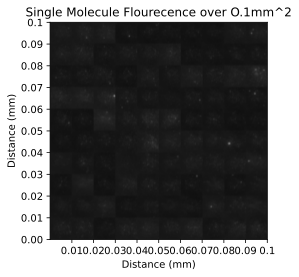

In [16]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Open the input image as numpy array, convert to greyscale and drop alpha
from matplotlib import cm

npImage=np.array(Image.open("ms_colalge_one.png").convert("L"))
x_label_list = ['0.01', '0.02','0.03','0.04', '0.05','0.06', '0.07','0.08', '0.09', '0.1']
y_label_list = ['0.1','0.09','0.08','0.07','0.06', '0.05','0.04', '0.03','0.02', '0.01', '0.00']

#npImage= npImage.set_clim(0, 0.5)

fig, ax = plt.subplots(1,1)

plt.imshow(npImage,cmap="gray")
plt.clim(0,500)
plt.xticks(ticks=[170,2*170,3*170,4*170,5*170,6*170,7*170,8*170,9*170,10*170], labels=x_label_list)

plt.yticks(ticks=[0, 170,2*170,3*170,4*170,5*170,6*170,7*170,8*170,9*170,10*170], labels=y_label_list)


plt.title('Single Molecule Flourecence over O.1mm^2')

plt.ylabel("Distance (mm)")
plt.xlabel("Distance (mm)")
plt.show()

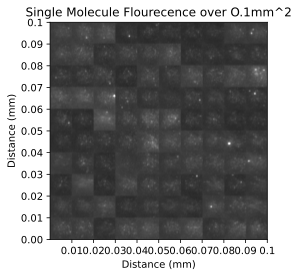

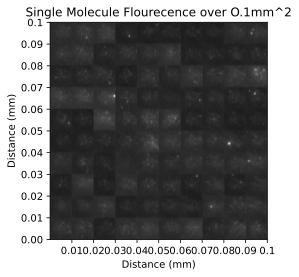

In [19]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Open the input image as numpy array, convert to greyscale and drop alpha
from matplotlib import cm

npImage=np.array(Image.open("ms_colalge_one.png").convert("L"))




#npImage= npImage.set_clim(0, 0.5)


fig, ax = plt.subplots(1,1)
x_label_list = ['0.01', '0.02','0.03','0.04', '0.05','0.06', '0.07','0.08', '0.09', '0.1']
plt.imshow(npImage,cmap="gray")
plt.clim(0, 200)
plt.xticks(ticks=[170,2*170,3*170,4*170,5*170,6*170,7*170,8*170,9*170,10*170], labels=x_label_list)
y_label_list = ['0.1','0.09','0.08','0.07','0.06', '0.05','0.04', '0.03','0.02', '0.01', '0.00']
plt.yticks(ticks=[0, 170,2*170,3*170,4*170,5*170,6*170,7*170,8*170,9*170,10*170], labels=y_label_list)


plt.title('Single Molecule Flourecence over O.1mm^2')

plt.ylabel("Distance (mm)")
plt.xlabel("Distance (mm)")




#ax.set_xticks([1,2,3,4,5,6,7,8,9,10])
#ax.set_xticklabels(['0.01', '0.02','0.03','0.04', '0.05','0.06', '0.07','0.08', '0.09', '0.1'])

ig, ax = plt.subplots(1,1)

ax.imshow(npImage, cmap="gray")
#ax.set_clim(0, 40)


ax.set_xticks([170,2*170,3*170,4*170,5*170,6*170,7*170,8*170,9*170,10*170])
ax.set_xticklabels(x_label_list)

y_label_list = ['0.1','0.09','0.08','0.07','0.06', '0.05','0.04', '0.03','0.02', '0.01', '0.00']
ax.set_yticks([0, 170,2*170,3*170,4*170,5*170,6*170,7*170,8*170,9*170,10*170])
ax.set_yticklabels(y_label_list)

plt.title('Single Molecule Flourecence over O.1mm^2')

plt.ylabel("Distance (mm)")
plt.xlabel("Distance (mm)")

plt.show()


# Get brightness range - i.e. darkest and lightest pixels
min=np.min(npImage)        # result=144
max=np.max(npImage)        # result=216

# Make a LUT (Look-Up Table) to translate image values
LUT=np.zeros(256,dtype=np.uint8)
LUT[min:max+1]=np.linspace(start=0,stop=255,num=(max-min)+1,endpoint=True,dtype=np.uint8)

# Apply LUT and save resulting image
Image.fromarray(LUT[npImage]).save('ms_collage_one_result.png')